# EOG
Ch1 -> Up

Ch2 -> Down

Ch3 -> Right

Ch4 -> Left

In [10]:

#%matplotlib notebooks
import matplotlib
import matplotlib.pyplot as plt
from matplotlib.ticker import LinearLocator, FormatStrFormatter
from mpl_toolkits.mplot3d import Axes3D
%matplotlib inline
%pylab inline


Populating the interactive namespace from numpy and matplotlib


In [11]:
import mpld3
mpld3.enable_notebook()

In [12]:
import pandas as pd
import numpy as np
import scipy.fftpack

# Define functions

In [13]:
from scipy.signal import iirfilter, lfilter, butter
def notch_filter(time, band, freq, ripple, order, filter_type, data):
    fs   = 1/time
    nyq  = fs/2.0
    low  = freq - band/2.0
    high = freq + band/2.0
    low  = low/nyq
    high = high/nyq
    b, a = iirfilter(order, [low, high], rp=ripple, btype='bandstop',
                     analog=False, ftype=filter_type)
    filtered_data = lfilter(b, a, data)
    return filtered_data

def butter_bandpass(lowcut, highcut, fs, order=5):
    nyq = 0.5 * fs
    low = lowcut / nyq
    high = highcut / nyq
    b, a = butter(order, [low, high], btype='band')
    return b, a

def butter_bandpass_filter(data, lowcut, highcut, fs, order=5):
    b, a = butter_bandpass(lowcut, highcut, fs, order=order)
    y = lfilter(b, a, data)
    return y

def plot_channels(data, title,  xlabel='Time (s)', ylabel='Amplitude (\u03BCV)'):
    plt.figure(figsize=(12, 6))
    channels = [{'channel':'ch1', 'label':'Up'},
                {'channel':'ch2', 'label':'Down'},
                {'channel':'ch3', 'label':'Right'},
                {'channel':'ch4', 'label':'Left'}]
    for channel in channels:
        plt.plot(data['time'], data[channel['channel']], label= channel['channel'] + ': ' + channel['label'])
    
    ax = plt.gca()
    ax.legend()
    plt.title(title)
    plt.ylabel(ylabel)
    plt.xlabel(xlabel)
    plt.show()

def plot_channel_with_marker(data, marker, channel, title,  xlabel='Time (s)', ylabel='Amplitude (\u03BCV)'):
    plt.figure(figsize=(12, 6))
    plt.plot(data['time'], data[channel], label= channel)
    plt.plot(marker['time'], marker[channel], label= 'Marker' + channel)
    
    ax = plt.gca()
    ax.legend()
    plt.title(title)
    plt.ylabel(ylabel)
    plt.xlabel(xlabel)
    plt.show()

def filter_data(title, filepath, starting_point=0, lowcut_freq=0.1, highcut_freq=30, notch=False,print_plot = False):
    data = pd.read_csv(filepath,
                   header = 5,
                   names = ['sampleIdx','ch1','ch2','ch3','ch4','accel1','accel2','accel3','timeFormatted','time'])   
    # at the moment, timeFormatted is not important and is not well formatted, 
    # as well as sampleIdx and accelerometer data, so we can delete it.
    data = data.drop(["sampleIdx","timeFormatted", "accel1", "accel2", "accel3"],axis=1)

    # reorder dataframe
    data = data[['time', 'ch1', 'ch2', 'ch3', 'ch4']]

    # number of samples
    N = len(data['time']) 

    # sampling frequency (Hz)
    fs = 200.0 

    # sampling period (seconds)
    T = 1.0 / fs 

    startTime = (data['time'].loc[0]).astype(np.float64)
    stopTime = (startTime + N*T)
    time = np.linspace(startTime, stopTime, N)
    time = np.around(time, decimals=3)

    startFromZero = True

    if (startFromZero):
        time = time - round(startTime,3)
        time = np.around(time, decimals=3)
        data['time'] = time
    else:
        data['time'] = time

    #print(data.head())
    
    # select starting point
    # data = data.drop(data[(data['time']<starting_point)].index, inplace = False)
    
    # Required input defintions are as follows;
    # time:   Time between samples
    # band:   The bandwidth around the centerline freqency that you wish to filter
    # freq:   The centerline frequency to be filtered
    # ripple: The maximum passband ripple that is allowed in db
    # order:  The filter order.  For FIR notch filters this is best set to 2 or 3,
    #         IIR filters are best suited for high values of order.  This algorithm
    #         is hard coded to FIR filters
    # filter_type: 'butter', 'bessel', 'cheby1', 'cheby2', 'ellip'
    # data:         the data to be filtered
    
    channels = ['ch1', 'ch2', 'ch3', 'ch4']
    filtData = pd.DataFrame()
    filtData['time'] = data['time']
    for channel in channels:
        filtData[channel] = butter_bandpass_filter(data = data[channel],
                                                   lowcut = lowcut_freq,
                                                   highcut = highcut_freq,
                                                   fs = fs)
        if notch:
            filtData[channel] = notch_filter(time = T, 
                                             band = 0.1, 
                                             freq = 50.0, 
                                             ripple = 0.5, 
                                             order = 2.0, 
                                             filter_type = 'butter', 
                                             data = filtData[channel])
        
    if print_plot: 
        plot_channels(data=filtData, 
                      title=title)
    
    return filtData


In [14]:
# Let's apply a smoothing to the signal with time moving windows:
from numpy import *
from pylab import *

def smooth(x,window_len,window='hanning'):  # x is the filtered data
    """
    smooth the data using a window with requested size.
    
    This method is based on the convolution of a scaled window with the signal.
    The signal is prepared by introducing reflected copies of the signal 
    (with the window size) in both ends so that transient parts are minimized
    in the begining and end part of the output signal.
    
    input:
        x: the input signal 
        window_len: the dimension of the smoothing window; should be an odd integer
        window: the type of window from 'flat', 'hanning', 'hamming', 'bartlett', 'blackman'
            flat window will produce a moving average smoothing.

    output:
        the smoothed signal
        
    example:

    t=linspace(-2,2,0.1)
    x=sin(t)+randn(len(t))*0.1
    y=smooth(x)
    
    see also: 
    
    numpy.hanning, numpy.hamming, numpy.bartlett, numpy.blackman, numpy.convolve
    scipy.signal.lfilter
 
    TODO: the window parameter could be the window itself if an array instead of a string
    NOTE: length(output) != length(input), to correct this: return y[(window_len/2-1):-(window_len/2)] instead of just y.
    """

    if x.ndim != 1:
        raise ValueError("smooth only accepts 1 dimension arrays.")
        
    if x.size < window_len:
        raise ValueError("Input vector needs to be bigger than window size.")


    if window_len<3:
        return x


    if not window in ['flat', 'hanning', 'hamming', 'bartlett', 'blackman']:
        raise ValueError("Window is on of 'flat', 'hanning', 'hamming', 'bartlett', 'blackman'")


    s=np.r_[x[window_len-1:0:-1],x,x[-2:-window_len-1:-1]] # numpy.r_ is for building an array
    #print(len(s))
    if window == 'flat': #moving average
        w=numpy.ones(window_len,'d')
    else:
        w=eval('np.'+window+'(window_len)')

    y=np.convolve(w/w.sum(),s,mode='valid')
    return y
def smooth_all_channels(data, window_len, starting_point = 0  ): # this function will plot every channel
    '''
    This function basically smoothes every channel we have. Notice that the channels must be previously 
    filtered.
    '''
    channels = ['ch1', 'ch2', 'ch3', 'ch4']
    smthData = pd.DataFrame()
    
    for channel in channels:
        smthData[channel] = smooth(data[channel],window_len,window='blackman')
    
    # number of samples
    N = len(smthData['ch1']) 

    # sampling frequency (Hz)
    fs = 200.0 

    # sampling period (seconds)
    T = 1.0 / fs 

    startTime = 0
    time = np.linspace(0, startTime + N*T, N)
    time = np.around(time, decimals=3)

    startFromZero = True

    if (startFromZero):
        time = time - round(startTime,3)
        time = np.around(time, decimals=3)
        smthData['time'] = time
    else:
        smthData['time'] = time

    # x = x[(x['time']>starting_point)]
    smthData = smthData[['time', 'ch1', 'ch2', 'ch3', 'ch4']]
    return smthData

# Direction plots without smoothing 


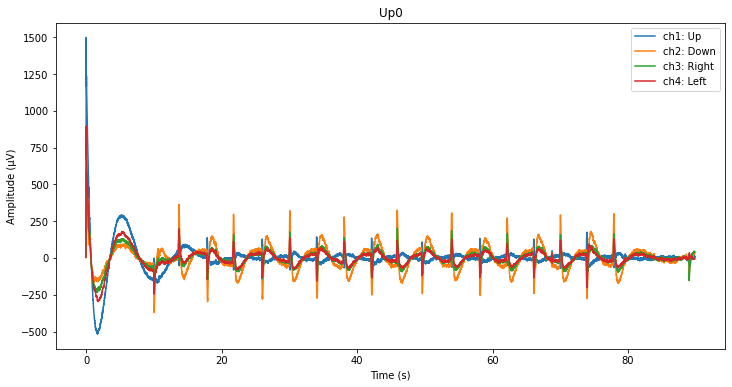

ParserError: Passed header=5 but only 1 lines in file

In [15]:
# for counting the files inside a directory:
import os
def count_files(dir):
    return len([1 for x in list(os.scandir(dir)) if x.is_file()])

def print_all_data(folder, num_plts = 2):
    """
    Folder is the position (up, right, left, down)
    """
    filepath = 'data/{}'.format(folder)
    pos = {}
    for num, file in enumerate(list(os.listdir(filepath))):
        name = '{}_filt_{}'.format(folder, num)
        if num < num_plts:            
            pos[name] = filter_data(title = (folder.capitalize()) + '{}'.format(num),
                                    filepath=filepath+'/'+file, print_plot = True)
        else:
            pos[name] = filter_data(title = (folder.capitalize()) + '{}'.format(num),
                                    filepath=filepath+'/'+file, print_plot = False)
    return pos
up_filt    = print_all_data('up',num_plts = 1)        
down_filt  = print_all_data('down',num_plts = 0)
right_filt = print_all_data('right', num_plts = 0)        
left_filt  = print_all_data('left', num_plts = 0)
 # down_filt = filter_data(title='Down',
#                    filepath=OpenBCISession_eye_movement_test_down/OpenBCI-RAW-2020-03-14_12-24-40.txt')

# up_filt = filter_data(title='Up',
#                    filepath='data/OpenBCISession_eye_movement_test_up/OpenBCI-RAW-2020-03-14_12-22-40.txt')

# left_filt = filter_data(title='Left',
#                    filepath='data/OpenBCISession_eye_movement_test_left/OpenBCI-RAW-2020-03-14_12-00-17.txt')

# right_filt = filter_data(title='Right',
#                    filepath='data/right/Test_R_2_0.txt')

# blink_filt = filter_data(title='Blink',
#                     filepath='data/OpenBCISession_eye_blink_test/OpenBCI-RAW-2020-03-14_13-02-53.txt',
#                     starting_point=5, lowcut_freq=0.1, highcut_freq=60, notch=True)

In [ ]:
up_filt

# Direction plots with the smoothing

In [ ]:


def smth_all(sig_filt, num_plot = 1, window_len = 50):
    """
    sig_filt is the filtered signal dictionari
    """
    sig_smth = {}
    for num, sig_f in enumerate(sig_filt): 
        sig_smth[sig_f+'_smth'] = smooth_all_channels(sig_filt[sig_f], window_len ) # the second input is the windows length (the bigger the smoother)
        if num_plot > num:   
            plot_channels(sig_smth[sig_f+'_smth'], '{} with smoothed data'.format(sig_f+'_smth'),  xlabel='Time (s)', ylabel='Amplitude (\u03BCV)')
    return sig_smth
up_smth = smth_all(up_filt)
down_smth = smth_all(down_filt)
right_smth = smth_all(right_filt)
left_smth = smth_all(left_filt)
up_smth
# up_smth = smooth_all_channels(up_filt, window_len ) # the second input is the windows length (the bigger the smoother)
# plot_channels(up_smth, 'Up with smoothed data',  xlabel='Time (s)', ylabel='Amplitude (\u03BCV)')

# right_smth = smooth_all_channels(right_filt, window_len ) # the second input is the windows length (the bigger the smoother)
# plot_channels(right_smth, '`Right with smoothed data',  xlabel='Time (s)', ylabel='Amplitude (\u03BCV)')

# left_smth = smooth_all_channels(left_filt, window_len ) # the second input is the windows length (the bigger the smoother)
# plot_channels(left_smth, 'Left with smoothed data',  xlabel='Time (s)', ylabel='Amplitude (\u03BCV)')


# Algorithm 1: detection of peaks & Derivative

In [16]:
# The derivative function is created. It also plots de signal with its respective channel. 
def derivative(direction, chan, pl = False,thresh = 8): #direction is the way you are looking at, chan is the channel string, pl says whether or not you want to plot 
    
    direction_d = direction.diff()
    direction_d['time'] = direction['time']
    channels = ['ch1','ch2','ch3','ch4'] 
    direction_dz = direction_d.copy()
    for channel in channels:
        ch = direction_dz[channel]
        ch[abs(ch)<thresh] = 0      # This is a threshhold
        direction_dz[channel] = ch * 10
    if pl:
        plot_channel_with_marker(data=direction, marker=direction_dz, channel='{}'.format(str(chan)), title="{} ".format(str(chan)))
    return direction_dz
    
        
    
    
 

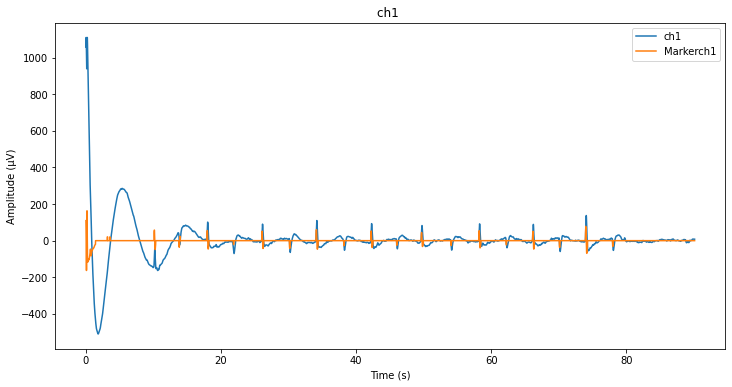

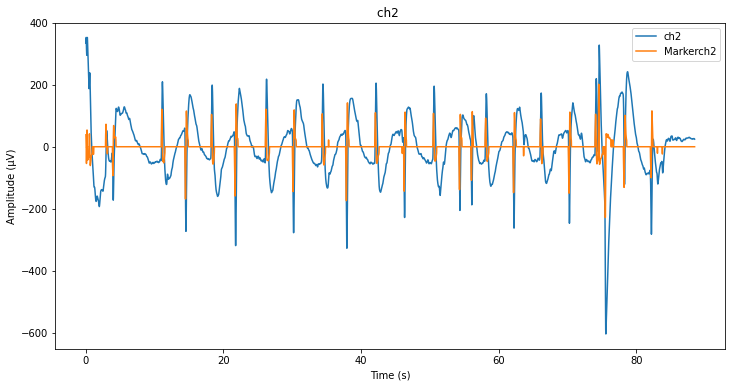

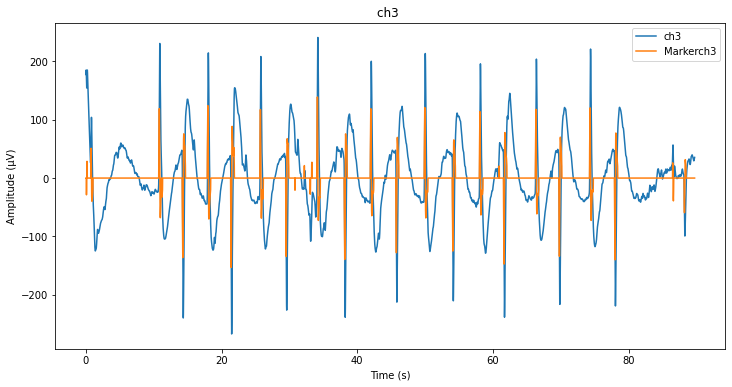

NameError: name 'left_smth' is not defined

In [17]:
# with each derivative we compare every direction with the electrode of the direction. i.e up goes with ch1, down with ch2...
def all_derivative(smth_sig, chan ,num_plots=1):
    
    sig_der = {}
    for num, sig in enumerate(smth_sig):
        if num_plots > num: 
            sig_der[sig + '_der'] = derivative(smth_sig[sig], chan, pl = True, thresh = 2)
        else:
            sig_der[sig + '_der'] = derivative(smth_sig[sig], chan, pl = False, thresh = 2)
    return sig_der
der_up    = all_derivative(up_smth,'ch1', num_plots=1)
der_down  = all_derivative(down_smth,'ch2', num_plots=1)
der_right = all_derivative(right_smth,'ch3', num_plots=1)
der_left  = all_derivative(left_smth,'ch4', num_plots=1)
# der_up = derivative(up_smth['up_filt_1_smth'], 'ch1', pl = True, thresh = 2)
# der_down = derivative(down_smth, 'ch2', pl = True)
# der_right = derivative(right_smth, 'ch3', pl = True)
# der_left = derivative(left_smth, 'ch4', pl = True)

In [20]:
# What is done now is:
# 0- Avoiding the first seconds
# 1- choosing the parts where the derivative passes from 0 to a negative number (remember that the signals in the EOG are positive when negative).
# 2- applying a threshold to the derivative.
# 3- if the answer is true, the cut-off between the signal an the the aplitude 0 is seeked. 
# 4- After finding the point, the pointer will jump X samples to the right, for avoiding consecutive derivatives.
def marcas_direction(der_direc, direction,  starting_time = 5, ending_time = 2, skip_sec = 2, negative_thresh = -80, positive_thresh = 50): 
    """
    This function detects when a given action is done (left, up right, down) with the derivative
    der_direc = derivative at one direction
    direction = a string of the direction
    starting_time = the time when we are going to start
    skip_sec = the amount of sample that are going to be ignored after finding a derivative
    negative_thresh = the threshold for accepting a negative derivative 
    positive_thresh = the threshold for accepting a positive derivative 
    """
    channels = {'up':'ch1', 'down':'ch2', 'right': 'ch3','left':'ch4'}
    fs = 200; # sampling frequency
    T = 1/fs;
    total_time = len(der_direc[channels[direction]])/fs
    der_direc_ch = der_direc[channels[direction]]
    idx = der_direc_ch.index.tolist() #lists the indexes of the dataframe

    marcas = []
    mrk = False
    for sample in idx[starting_time*fs:] :
        if mrk:
            skip -= 1
            if skip == 1:
                mrk = False
        elif der_direc_ch[sample-1] == 0 and der_direc_ch[sample] > 0 :
            if max(der_direc_ch[int(sample-skip_sec/2*fs):int(sample+skip_sec/2*fs)]) > positive_thresh:
                mrk = True
                skip = skip_sec*fs
        elif der_direc_ch[sample-1] == 0 and der_direc_ch[sample] < 0 :
            if min(der_direc_ch[int(sample-skip_sec/2*fs):int(sample+skip_sec/2*fs)]) < negative_thresh:
                marcas.append(sample)
                mrk = True
                skip = skip_sec*fs # with this you skip you signal X seconds ignoring all the derivatives found in that range.
            else:
                continue
        elif sample/fs > total_time-ending_time:
            break
#     print(marcas)
    return(marcas)

In [18]:
def all_marcas(der_sig, chan,  starting_time = 5, ending_time = 2, skip_sec = 2, negative_thresh = -80, positive_thresh = 50):  
    sig_marcas = {}
    for num, sig in enumerate(der_sig):
        sig_marcas[sig + '_marcas'] = marcas_direction(der_sig[sig], chan, starting_time = starting_time, ending_time= ending_time, skip_sec = skip_sec, negative_thresh= negative_thresh, positive_thresh = positive_thresh)
    return sig_marcas

all_marcas(der_up, 'up')
marcas_up    = all_marcas(der_up,'up', starting_time = 5, ending_time=2, skip_sec = 2, negative_thresh= -25, positive_thresh = 30)
marcas_down  = all_marcas(der_down,'down', starting_time = 5, ending_time=2, skip_sec = 2, negative_thresh= -100, positive_thresh = 50)
marcas_right = all_marcas(der_right,'right', starting_time = 5, ending_time=10, skip_sec = 2, negative_thresh= -80, positive_thresh = 50)
marcas_left  = all_marcas(der_left,'left', starting_time = 5, ending_time=5, skip_sec = 2, negative_thresh= -80, positive_thresh = 50)

marcas_up
# marcas_up = marcas_direction(der_up,'up', starting_time = 5, ending_time=2, skip_sec = 2, negative_thresh= -25, positive_thresh = 30)
# marcas_down = marcas_direction(der_down,'down', starting_time = 5, ending_time=2, skip_sec = 2, negative_thresh= -100, positive_thresh = 50)
# marcas_right = marcas_direction(der_right,'right', starting_time = 5, ending_time=10, skip_sec = 2, negative_thresh= -80, positive_thresh = 50)
# marcas_left = marcas_direction(der_left,'left', starting_time = 5, ending_time=5, skip_sec = 2, negative_thresh= -80, positive_thresh = 50)



NameError: name 'marcas_direction' is not defined

In [19]:
# The next step is to use the "marcas" vector for detecting the direction signal.
def segmented_signal(signal, marcas, left_bias=0.25, right_bias=1, count1 = 1 ): 
    '''
    This function returns all the segments of the signal desired. 
    marcas = vector that detects when the signal starts (see marcas_direction)
    The filtered signal 
    left_bias = selects X second to the left of the marker (seconds)
    right_bias = selects Y second to the right of the marker 
    OUTPUT:
    ---> SEGM: It returns a dataframe of the values in the segments 
    ---> time_SEGM: It returns a dataframe of the times of the segments
    '''
    fs =200;
    T = 1/fs
    
    time_chan = ['time','ch1','ch2','ch3','ch4']
    # We create parameters for multiidexing
    mult_idx = []
    mult_idx_ch = []
    count1 = count1
#     count1 = 1   
    for start_1 in range(len(marcas)):
        count2 = 1 
        mrk = True
        while mrk:
            mult_idx.append('Segment {}'.format(count1))
            count2 += 1
            if count2 == 6:
                mrk = False
        mult_idx_ch.extend(['time','ch1','ch2','ch3','ch4'])
        count1 +=1
    col = pd.MultiIndex.from_arrays([mult_idx,mult_idx_ch])
    
    # Now, we create a indexed table   
    count = 1
    
    time_segmented = []
    for start in marcas:
        time_segmented_0 = signal.loc[start-left_bias*fs:start+right_bias*fs,'time']
        time_segmented_0 = time_segmented_0.reset_index(drop=True)
        time_segmented.append(list(time_segmented_0))
#         SEGM['time'] = time_segmented
        channels = ['ch1','ch2','ch3','ch4']
        information_list = []
        for channel in channels:
            
            signal_segmented = signal.loc[start-left_bias*fs:start+right_bias*fs,channel]
#             signal_segmented = signal_segmented.reset_index(drop=True)
            current_channel= list(signal_segmented)
            information_list.append(current_channel)
        time_segmented.extend(information_list)    
        
        count +=1

    SEGM = pd.DataFrame(np.array(time_segmented).T,columns = col)    
        
    return SEGM
        
        
        

In [15]:
up_filt

{'up_filt_0':          time          ch1         ch2         ch3         ch4
 0       0.000    13.261182    3.429998    4.867714    4.911488
 1       0.005   105.474758   26.704027   38.403193   38.631011
 2       0.010   391.530894   96.118413  141.208021  141.195962
 3       0.015   912.528470  215.010441  325.843395  322.659807
 4       0.020  1521.608046  341.764065  538.730676  526.471029
 ...       ...          ...         ...         ...         ...
 17913  89.570   -33.692694  -25.355582  -71.092841   31.511122
 17914  89.575   -36.119220  -27.967844  -73.156912   33.021062
 17915  89.580   -41.841511  -39.320466  -76.984988   27.222988
 17916  89.585   -40.646832  -42.750148  -74.262991   25.382010
 17917  89.590   -29.261788  -32.360803  -65.271543   29.738543
 
 [17918 rows x 5 columns],
 'up_filt_1':          time          ch1         ch2         ch3         ch4
 0       0.000    13.565482    3.537998    4.940078    5.056764
 1       0.005   107.757342   27.350180   38.9412

In [16]:
for i in marcas_left:
    print(len(marcas_left[i]))
marcas_left


9
9
9
8
9
10
9
9
9
9


{'left_filt_0_smth_der_marcas': [2847,
  4377,
  5987,
  7616,
  9223,
  10814,
  12448,
  14022,
  15632],
 'left_filt_1_smth_der_marcas': [2862,
  4449,
  6063,
  7626,
  9230,
  10896,
  12470,
  14040,
  15624],
 'left_filt_2_smth_der_marcas': [2870,
  4480,
  6078,
  7709,
  9281,
  10922,
  12442,
  13945,
  15644],
 'left_filt_3_smth_der_marcas': [2838,
  4462,
  6092,
  9295,
  10841,
  12434,
  14102,
  15605],
 'left_filt_4_smth_der_marcas': [2821,
  4413,
  6047,
  7567,
  9263,
  10867,
  12414,
  14034,
  15547],
 'left_filt_5_smth_der_marcas': [1140,
  2876,
  4483,
  6029,
  7643,
  9242,
  10682,
  12454,
  14077,
  15675],
 'left_filt_6_smth_der_marcas': [2799,
  4426,
  6042,
  7606,
  9244,
  10826,
  12412,
  14038,
  15674],
 'left_filt_7_smth_der_marcas': [2852,
  4322,
  6019,
  7627,
  9264,
  10836,
  12448,
  14082,
  15613],
 'left_filt_8_smth_der_marcas': [2845,
  4410,
  6056,
  7592,
  9225,
  10805,
  12417,
  14040,
  15632],
 'left_filt_9_smth_der_marca

In [20]:
def all_segments(sig_filt, marcas_sig):
#     table =  pd.DataFrame()
    for num_1, sig in enumerate(sig_filt): 
        for num_2, mar in enumerate(marcas_sig):
            count1 = 1
            if num_1 == num_2:
                if num_1 == 0:
                    colum = []
            else: 
                colum = list(table.columns)
                
            for col in range(1,len(colum)+1):
                if str(col) in str(colum[-1]):
                    count1 = col + 1
                
            if num_1 == num_2:
                if num_1 == 0:
                    try:
                        table  = segmented_signal(sig_filt[sig], marcas_sig[mar], left_bias=0.5, right_bias=2, count1 = 1)  
                    except ValueError:
                        pass
                else:
                    try:
                        tab = segmented_signal(sig_filt[sig], marcas_sig[mar], left_bias=0.5, right_bias=2, count1 = count1)
                        table  = table.join(tab)
    
                    except ValueError:
                        pass  # do nothing!
                        
            else:
                continue
    return table
UP_SEGMENTS = all_segments(up_filt,marcas_up)
DOWN_SEGMENTS = all_segments(down_filt,marcas_down)
RIGHT_SEGMENTS = all_segments(right_filt,marcas_right)
LEFT_SEGMENTS = all_segments(left_filt,marcas_left)
pd.set_option('display.max_columns', 1000)

LEFT_SEGMENT
# plt.plot(nigbor['Segment 7']['ch1'])


# segmented_signal(down_filt['down_filt_4'], marcas_down['down_filt_4_smth_der_marcas'], left_bias=0.5, right_bias=2, count1 = 10)
# UP_SEGMENTS    = segmented_signal(up_filt, marcas_up, left_bias=0.5, right_bias=2)
# DOWN_SEGMENTS  = segmented_signal(down_filt, marcas_down, left_bias=0.5, right_bias=2)
# RIGHT_SEGMENTS = segmented_signal(right_filt, marcas_right, left_bias=0.5, right_bias=2)
# LEFT_SEGMENTS  = segmented_signal(left_filt, marcas_left, left_bias=0.5, right_bias=2)

# RIGHT_SEGMENTS

AttributeError: 'DataFrame' object has no attribute 'show'

Text(0.5, 1.0, 'Selected Segment')

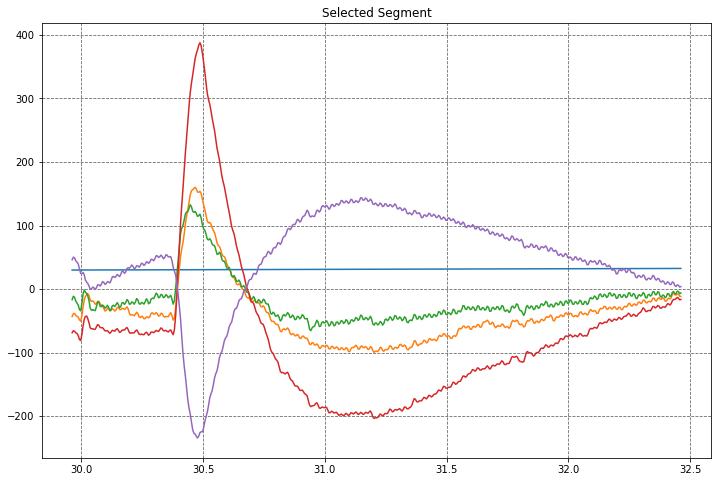

In [19]:
# REMEMBER, if your channel must be the same as your segment 
plt.figure(figsize=(12,8))
plt.plot(LEFT_SEGMENTS['Segment 30','time'],LEFT_SEGMENTS['Segment 30'] )
plt.grid(b=True, which='major', color='#666666', linestyle='--')
plt.title('Selected Segment')
# RIGHT_SEGMENTS['Segment 1']

# TESTING THINGS

In [ ]:
array_ch1_up = pd.array(up["ch1"]).to_numpy()
array_ch2_up = pd.array(up["ch2"]).to_numpy()
array_ch3_up = pd.array(up["ch3"]).to_numpy()
array_ch4_up = pd.array(up["ch4"]).to_numpy()

In [ ]:
array_ch1_down = pd.array(down["ch1"]).to_numpy()
array_ch2_down = pd.array(down["ch2"]).to_numpy()
array_ch3_down = pd.array(down["ch3"]).to_numpy()
array_ch4_down = pd.array(down["ch4"]).to_numpy()

In [ ]:
array_ch1_left = pd.array(left["ch1"]).to_numpy()
array_ch2_left = pd.array(left["ch2"]).to_numpy()
array_ch3_left = pd.array(left["ch3"]).to_numpy()
array_ch4_left = pd.array(left["ch4"]).to_numpy()

In [ ]:
array_ch1_right = pd.array(right["ch1"]).to_numpy()
array_ch2_right = pd.array(right["ch2"]).to_numpy()
array_ch3_right = pd.array(right["ch3"]).to_numpy()
array_ch4_right = pd.array(right["ch4"]).to_numpy()

In [ ]:
up = np.array([array_ch1_up, array_ch2_up,array_ch3_up, array_ch4_up])
down = np.array([array_ch1_down, array_ch2_down,array_ch3_down, array_ch4_down])
left = np.array([array_ch1_left, array_ch2_left,array_ch3_left, array_ch4_left])
right = np.array([array_ch1_right, array_ch2_right,array_ch3_right, array_ch4_right])

In [ ]:
max_values = []
for array in up:
    value = array.min()
    max_values.append(value)
channel = max_values.index(min(max_values))
print(channel+1)

In [ ]:
max_values = []
for array in down:
    value = array.min()
    max_values.append(value)
channel = max_values.index(min(max_values))
print(channel+1)

In [ ]:
max_values = []
for array in left:
    value = array.min()
    max_values.append(value)
print(max_values)
channel = max_values.index(min(max_values))
print(channel+1)

In [ ]:
max_values = []
for array in right:
    value = array.min()
    max_values.append(value)
channel = max_values.index(min(max_values))
print(channel+1)